In [1]:
import cv2
import numpy as np
import os
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.utils import shuffle
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score, classification_report,  ConfusionMatrixDisplay, roc_curve, auc, precision_score, recall_score, f1_score, RocCurveDisplay
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer
PYDEVD_DISABLE_FILE_VALIDATION=1

## Extract Frames from the video

In [2]:
# Create a directory to save frames if it doesn't exist
output_dir = './frames'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

video_capture = cv2.VideoCapture('./Garden Video.mp4')

def getFrame(sec, count):
    video_capture.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
    hasFrames, image = video_capture.read()
    if hasFrames:
        # Save frame as PNG file
        cv2.imwrite(os.path.join(output_dir, f"image{count}.jpg"), image)
    return hasFrames

sec = 0
frameRate = 0.5  # Capture an image every 0.5 second
count = 1

success = getFrame(sec, count)
while success:
    count += 1
    sec += frameRate
    sec = round(sec, 2)
    success = getFrame(sec, count)

print(f"Extracted {count - 1} frames from the video.")

Extracted 519 frames from the video.


In [3]:
cassava_folder_path = './crop_datasets/cassava'
maize_folder_path = './crop_datasets/maize'
sugarcane_folder_path = './crop_datasets/sugarcane'
grass_folder_path = './crop_datasets/grass'

In [4]:
def load_images_from_folder(folder_path, target_size=(224, 224)):
    """
    Load and resize images from the specified folder to reduce memory usage.

    Args:
    - folder_path: Path to the folder containing images.
    - target_size: Desired size (width, height) to resize images.

    Returns:
    - A list of resized images.
    """
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize image to target size
            img_resized = cv2.resize(img, target_size)
            images.append(img_resized)
    return images


In [5]:
cassava_images = load_images_from_folder(cassava_folder_path)
maize_images = load_images_from_folder(maize_folder_path)
sugarcane_images = load_images_from_folder(sugarcane_folder_path)
grass_images = load_images_from_folder(grass_folder_path)

### Exploratory Data Analysis

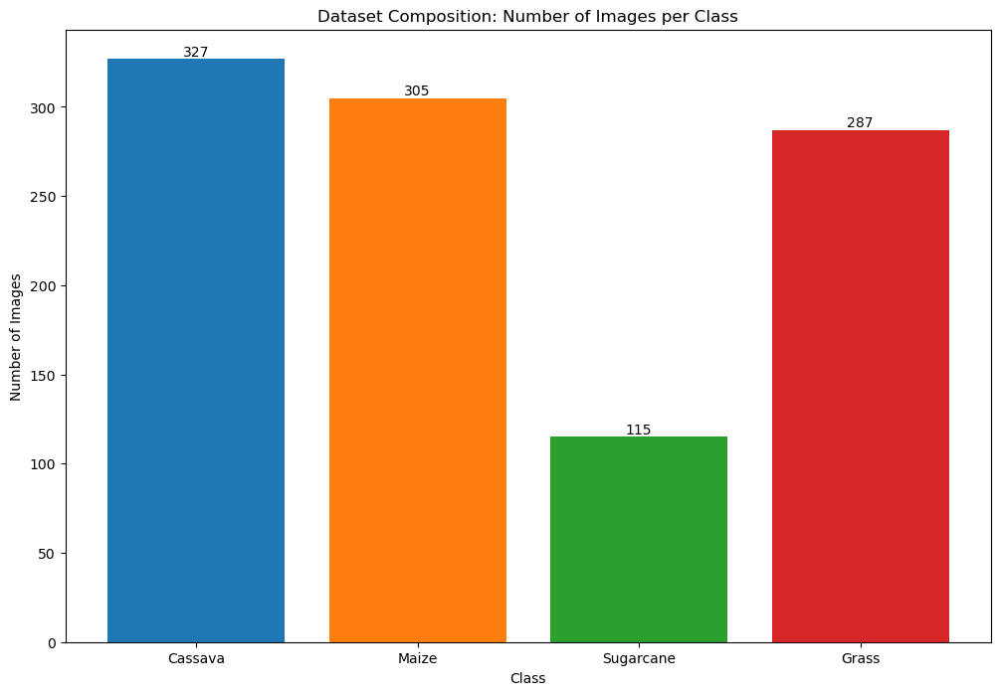

In [16]:
# # Count the number of images in each class
cassava_count = len(cassava_images)
maize_count = len(maize_images)
sugarcane_count = len(sugarcane_images)
grass_count = len(grass_images)

# Data for bar graph
labels = ['Cassava', 'Maize', 'Sugarcane', 'Grass']
counts = [cassava_count, maize_count, sugarcane_count, grass_count]

# Create a bar graph
plt.figure(figsize=(12, 8))
bars = plt.bar(labels, counts, color=plt.get_cmap('tab10').colors[:4])

# Add title and labels
plt.title('Dataset Composition: Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')

# Add text labels above bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Show the plot
plt.show()


#### Visualize sample images from the dataset

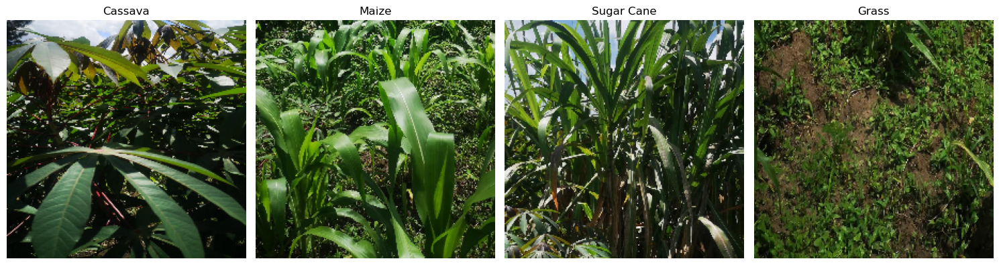

In [8]:
def visualize_sample_images(cassava_folder, maize_folder, sugarcane_folder, grass_folder):
    # Select one image from each class
    sample_images = [
        cassava_images[0] if cassava_images else None,
        maize_images[0] if maize_images else None,
        sugarcane_images[0] if sugarcane_images else None,
        grass_images[0] if grass_images else None,
    ]
    class_names = ['Cassava', 'Maize', 'Sugar Cane', 'Grass']

    # Plot the images
    fig, axs = plt.subplots(1, 4, figsize=(15, 5))

    for i, img in enumerate(sample_images):
        if img is not None:
            axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axs[i].set_title(class_names[i])
        else:
            axs[i].set_title(f'{class_names[i]} (No Image)')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()
    
# Visualize a sample image from each class
visualize_sample_images(cassava_folder_path, maize_folder_path, sugarcane_folder_path, grass_folder_path)

In [12]:
def get_image_sizes(images):
    sizes = [(img.shape[1], img.shape[0]) for img in images]
    return sizes

def visualize_sizes(sizes, title):
    # Extract width and height from sizes
    widths = [size[0] for size in sizes]
    heights = [size[1] for size in sizes]

    # Plot histogram for image widths
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.hist(widths, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Image Width')
    plt.ylabel('Frequency')
    plt.title('Distribution of Image Widths')

    # Plot histogram for image heights
    plt.subplot(1, 3, 2)
    plt.hist(heights, bins=50, color='green', alpha=0.7)
    plt.xlabel('Image Height')
    plt.ylabel('Frequency')
    plt.title('Distribution of Image Heights')

    # Set title for the overall plot
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

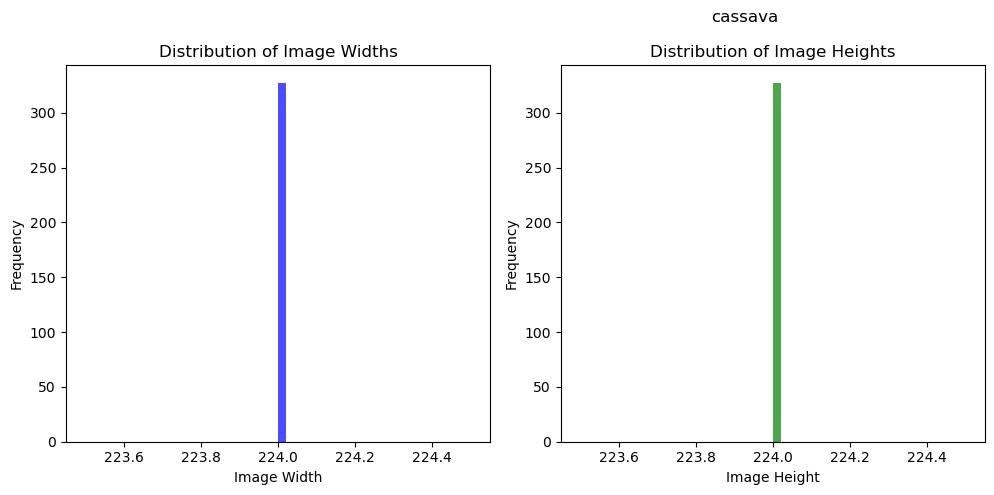

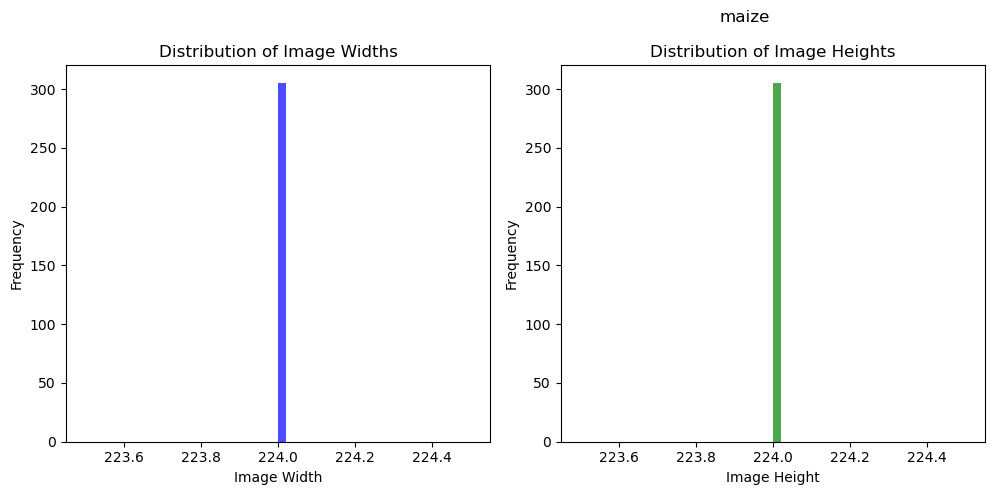

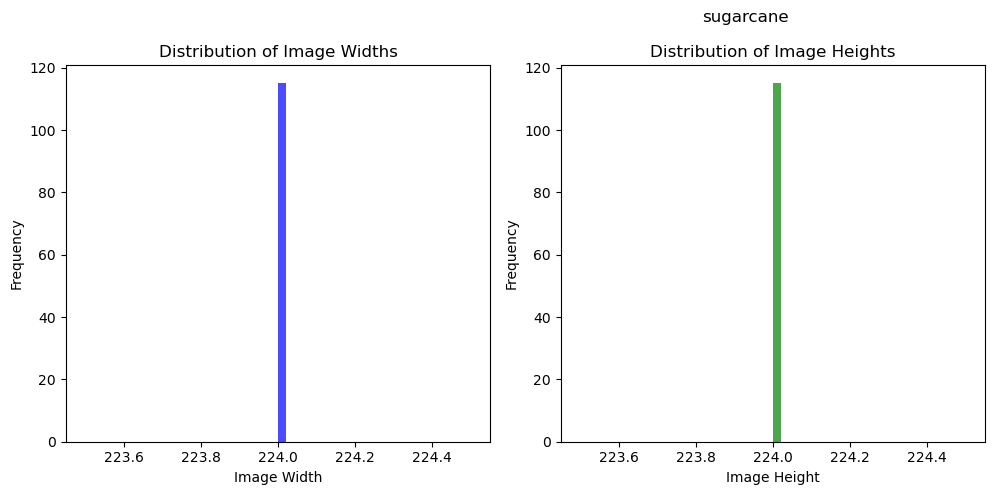

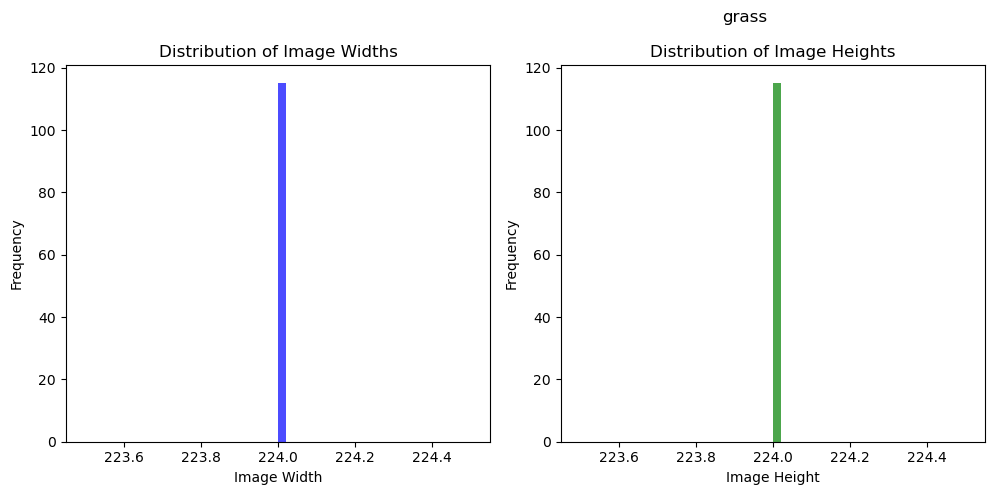

In [13]:
cassava_sizes = get_image_sizes(cassava_images)
maize_sizes = get_image_sizes(maize_images)
sugarcane_sizes = get_image_sizes(sugarcane_images)
grass_sizes = get_image_sizes(sugarcane_images)

# Visualize sizes and aspect ratios for good images
visualize_sizes(cassava_sizes, 'cassava')
visualize_sizes(maize_sizes, 'maize')
visualize_sizes(sugarcane_sizes, 'sugarcane')
visualize_sizes(grass_sizes, 'grass')

In [60]:
# Define function to compute color histogram
def compute_color_histogram(image, bins=(8, 8, 8)):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv_image], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

# Define function to visualize computed color histogram
def plot_color_histogram(image, ax, title):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    chans = cv2.split(hsv_image)
    colors = ("b", "g", "r")
    for i, color in enumerate(colors):
        hist = cv2.calcHist([chans[i]], [0], None, [256], [0, 256])
        ax.plot(hist, color=color, label=color)
        ax.set_xlim([0, 256])
    ax.set_title(title)
    ax.set_xlabel('Pixel Value')
    ax.set_ylabel('Frequency')
    ax.legend(['Hue', 'Saturation', 'Value'])
    ax.axis('on')


In [32]:
def non_max_suppression(edges):
    edges_copy = edges.copy()
    contours, _ = cv2.findContours(edges_copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        edges_copy[y:y+h, x:x+w] = cv2.dilate(edges_copy[y:y+h, x:x+w], None)
    edges_copy[edges_copy != edges] = 0
    return edges_copy

In [33]:
# Define function for adaptive Canny edge detection
def auto_canny_edge_detection(image, sigma=0.33):
    blurred = cv2.GaussianBlur(image, (3, 3), 0)
    md = np.median(blurred)
    lower_value = int(max(0, (1.0 - sigma) * md))
    upper_value = int(min(255, (1.0 + sigma) * md))
    edges = cv2.Canny(blurred, lower_value, upper_value)
    return cv2.dilate(non_max_suppression(edges), None)

In [34]:
def compute_edges(image, threshold=0.5):
  """
  Compute edge features with threshold limitation.

  Args:
      image: The input image.
      threshold: Threshold value (0.0-1.0) to limit edge pixels by intensity.

  Returns:
      A flattened array of edge pixels.
  """
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  edges = cv2.Canny(gray_image, 100, 200)

  # Apply threshold to limit edge pixels
  ret, thresholded_edges = cv2.threshold(edges, threshold * 255, 255, cv2.THRESH_BINARY)

  # Handle empty edges gracefully
  if thresholded_edges.sum() == 0:
    thresholded_edges = np.zeros_like(thresholded_edges)  # Empty array for edges

  # Flatten thresholded edges
  return thresholded_edges.flatten()

In [35]:
# Define function to compute keypoints and descriptors using ORB
def compute_detect_and_draw_keypoints(image, method='ORB', ax=None, title="Key Points of Interest"):
    """
    Compute, detect, and visualize key points of interest in the image.

    Args:
    - image: The input image.
    - method: Feature detection method ('ORB', 'SIFT', 'SURF').
    - ax: Matplotlib axis to plot the key points.
    - title: Title for the plot.

    Returns:
    - Flattened descriptors.
    """
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if method == 'SIFT':
        detector = cv2.SIFT_create()
    elif method == 'SURF':
        detector = cv2.xfeatures2d.SURF_create()
    elif method == 'ORB':
        detector = cv2.ORB_create()
    else:
        raise ValueError("Unsupported method")

    keypoints, descriptors = detector.detectAndCompute(gray_image, None)

    # Flatten descriptors
    if descriptors is not None:
        descriptors = descriptors.flatten()
    else:
        descriptors = np.array([])

    # Plot key points if ax is provided
    if ax is not None:
        keypoint_image = cv2.drawKeypoints(image, keypoints, None, color=(0, 255, 0), flags=0)
        ax.imshow(cv2.cvtColor(keypoint_image, cv2.COLOR_BGR2RGB))
        ax.set_title(title)
        ax.axis('off')

    return descriptors

In [36]:
# Define function to extract features from images in a directory

def extract_features_from_directory(directory, label, feature_methods):
  """
  Extract features and labels from a directory of images.

  Args:
      directory: Path to the directory containing images.
      label: Label for the images in the directory.
      feature_methods: List of feature extraction methods to use.

  Returns:
      A dictionary containing features for each image and a list of labels.
  """
  features_dict = {}
  labels = []

  for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
      image_path = os.path.join(directory, filename)
      image = cv2.imread(image_path)

      if image is not None:
        # Preprocess image (optional)
        resized_image = cv2.resize(image, (256, 256))  # Uncomment for resizing
        image = resized_image  # Use resized image for feature extraction

        extracted_features = {}
        for method in feature_methods:
          if method == 'color_histogram':
            color_histogram = compute_color_histogram(image)
            extracted_features[method] = color_histogram.flatten()  # Flatten histogram for dictionary
          elif method == 'edges':
            edges = compute_edges(image)
            extracted_features[method] = edges  # No flattening needed for edges
          elif method == 'keypoints_descriptors':
            descriptors = compute_detect_and_draw_keypoints(image)
            extracted_features[method] = descriptors.flatten()  # Flatten descriptors for dictionary

        # Handle empty features (optional)
        # If an image has no features for any method, create an empty dictionary
        if not extracted_features:
          extracted_features = {}  # Empty dictionary for images with no features

        
        # Print the contents of the features dictionary for each image
        print(f"Features for image {filename}: {extracted_features}")


        features_dict[filename] = extracted_features  # Add features to dictionary with filename as key
        labels.append(label)

  return features_dict, labels



In [37]:
# Define crop directories and their corresponding labels
crop_directories = {
    'cassava': './crop_datasets/cassava',  # No space here
    'maize': './crop_datasets/maize',
    'sugarcane': './crop_datasets/sugarcane',
    'grass': './crop_datasets/grass'
}


## Extract Features

In [38]:
feature_methods = ['color_histogram', 'edges', 'keypoints_descriptors']

# Initialize lists to store features and labels
all_features = []
all_labels = []

expected_length_for_method = {
    'color_histogram': 512,  # 8*8*8
    'edges': 256 * 256,
    'keypoints_descriptors': 32 * 32  # This is an arbitrary length; adjust based on your descriptors
}

# Extract features for each crop type
for label, directory in crop_directories.items():
    features, labels = extract_features_from_directory(directory, label, feature_methods)
    for filename, feature_dict in features.items():
        # Flatten feature_dict into a single list
        feature_list = []
        for method in feature_methods:
            if method in feature_dict:
                feature_list.extend(feature_dict[method])
            else:
                # Handle missing features
                feature_list.extend([0] * expected_length_for_method[method])
        all_features.append(feature_list)
        all_labels.append(label)

Features for image cassava_image_57.jpg: {'color_histogram': array([6.27732975e-03, 3.51910898e-03, 3.51910898e-03, 2.66310945e-03,
       3.99466418e-03, 5.04088588e-03, 5.99199673e-03, 5.42133022e-03,
       8.94043967e-03, 5.32621890e-03, 3.89955333e-03, 3.04355379e-03,
       1.90222112e-03, 1.71199907e-03, 5.13599720e-03, 2.85333162e-03,
       1.72151010e-02, 1.16035491e-02, 5.80177456e-03, 3.89955333e-03,
       3.51910898e-03, 1.99733209e-03, 1.42666581e-03, 1.04622159e-03,
       2.90088728e-02, 1.40764359e-02, 9.51110572e-03, 4.08977550e-03,
       2.18755426e-03, 1.14133267e-03, 5.70666336e-04, 9.51110560e-05,
       3.68079804e-02, 1.84515454e-02, 1.09377718e-02, 3.13866488e-03,
       1.33155473e-03, 3.80444224e-04, 0.00000000e+00, 0.00000000e+00,
       2.62506511e-02, 1.63591020e-02, 6.46755192e-03, 4.85066371e-03,
       2.75822054e-03, 3.80444224e-04, 0.00000000e+00, 0.00000000e+00,
       1.53128803e-02, 1.25546595e-02, 5.61155239e-03, 5.04088588e-03,
       4.1848863

### Visualize Edges, color histograms and points of interest

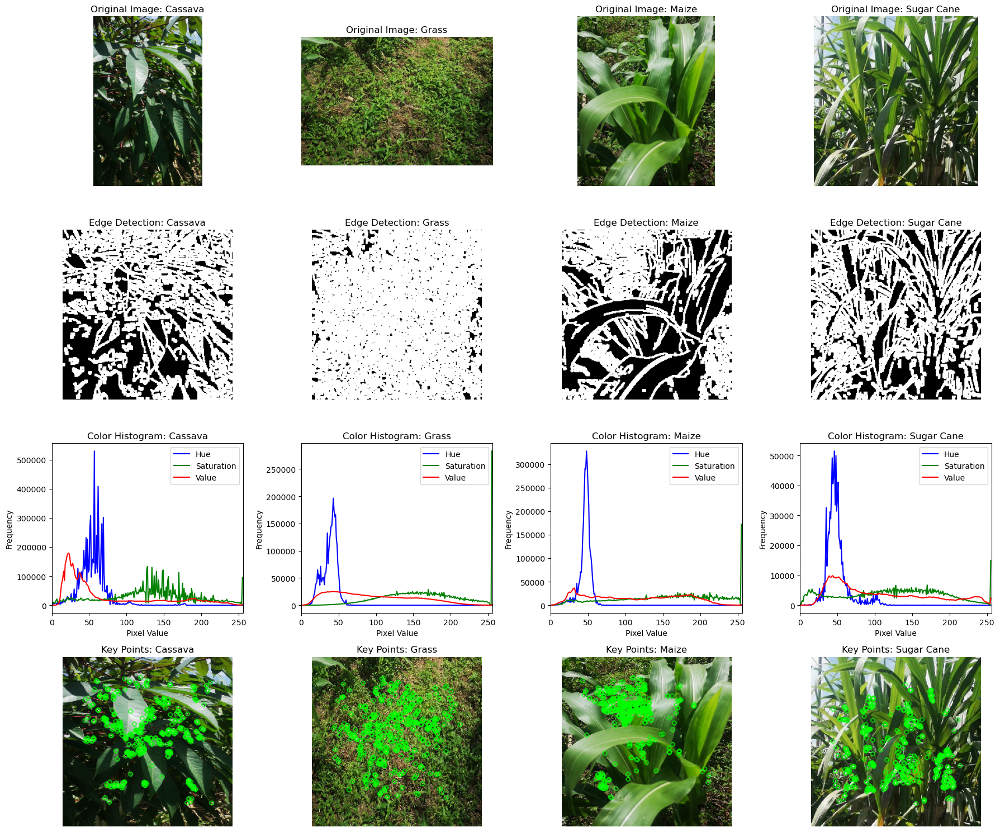

In [45]:
# Read and preprocess images
image_paths = ['./crop_datasets/cassava/cassava_image_259.jpg', './crop_datasets/grass/grass_image_274.jpg', './crop_datasets/maize/maize_image_20.jpg', './crop_datasets/sugarcane/sugarcane_17.jpg']
class_names = ['Cassava', 'Grass', 'Maize', 'Sugar Cane']
images = [cv2.imread(path) for path in image_paths]
processed_images = [cv2.resize(image, (256, 256)) for image in images]

# # Apply auto Canny edge detection to images
edges = [auto_canny_edge_detection(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)) for image in processed_images]

# Compute color histograms for each image
color_histograms = [compute_color_histogram(image) for image in images]

# Display original images, edge detection results, color histograms, and key points of interest
num_images = len(image_paths)
fig, axs = plt.subplots(4, num_images, figsize=(18, 15))

for i in range(num_images):
    #color histogram
    plot_color_histogram(images[i], axs[2, i], f'Color Histogram: {class_names[i]}')
    
    # Key points of interest
    compute_detect_and_draw_keypoints(processed_images[i], ax=axs[3, i], title=f'Key Points: {class_names[i]}')

    # Original image
    axs[0, i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    axs[0, i].set_title(f'Original Image: {class_names[i]}')
    axs[0, i].axis('off')

    # Edge detection
    axs[1, i].imshow(edges[i], cmap='gray')
    axs[1, i].set_title(f'Edge Detection: {class_names[i]}')
    axs[1, i].axis('off')
    
plt.tight_layout()
plt.show()

### Visualize Color Histograms

## Format Data

In [48]:
# Convert features and labels to a DataFrame
df_features = pd.DataFrame(all_features)
df_labels = pd.Series(all_labels, name='label')

# Concatenate features and labels into a single DataFrame
df_dataset = pd.concat([df_features, df_labels], axis=1)

# Display the dataset
print(df_dataset.head())

          0         1         2         3         4         5         6  \
0  0.006277  0.003519  0.003519  0.002663  0.003995  0.005041  0.005992   
1  0.000272  0.000181  0.000997  0.000634  0.000181  0.000634  0.002266   
2  0.000645  0.004114  0.001210  0.001694  0.002017  0.003307  0.008389   
3  0.002021  0.002848  0.002389  0.002481  0.001470  0.003400  0.005605   
4  0.089225  0.002378  0.001812  0.002491  0.001925  0.004416  0.006114   

          7         8         9  ...  81303  81304  81305  81306  81307  \
0  0.005421  0.008940  0.005326  ...    NaN    NaN    NaN    NaN    NaN   
1  0.004169  0.000634  0.001269  ...    NaN    NaN    NaN    NaN    NaN   
2  0.008308  0.000403  0.003388  ...    NaN    NaN    NaN    NaN    NaN   
3  0.015528  0.002021  0.005145  ...    NaN    NaN    NaN    NaN    NaN   
4  0.002831  0.003963  0.007473  ...    NaN    NaN    NaN    NaN    NaN   

   81308  81309  81310  81311    label  
0    NaN    NaN    NaN    NaN  cassava  
1    NaN    NaN 

In [49]:
# Replace NaN values with zeros
df_dataset.fillna(0, inplace=True)

In [50]:
print(df_dataset.tail())

             0         1         2         3         4         5         6  \
1029  0.000481  0.000361  0.000361  0.000722  0.000361  0.000842  0.000120   
1030  0.000477  0.000119  0.000477  0.000716  0.000835  0.000119  0.000358   
1031  0.000479  0.000360  0.000719  0.001199  0.001798  0.002637  0.002038   
1032  0.000515  0.000103  0.000206  0.000206  0.000206  0.000309  0.000206   
1033  0.000568  0.000114  0.000454  0.000568  0.001022  0.000341  0.001817   

             7         8         9  ...  81303  81304  81305  81306  81307  \
1029  0.000241  0.000361  0.002768  ...    0.0    0.0    0.0    0.0    0.0   
1030  0.000239  0.000239  0.001790  ...    0.0    0.0    0.0    0.0    0.0   
1031  0.001318  0.001798  0.002517  ...    0.0    0.0    0.0    0.0    0.0   
1032  0.000309  0.001545  0.001648  ...    0.0    0.0    0.0    0.0    0.0   
1033  0.001590  0.001022  0.002272  ...    0.0    0.0    0.0    0.0    0.0   

      81308  81309  81310  81311  label  
1029    0.0    0.0  

## Normalize/Standardize Features

In [51]:
# Extract feature columns and label column
X = df_dataset.drop(columns=['label'])
y = df_dataset['label']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

## Split Data into Training and Test Sets

In [52]:
 #Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Display the shape of the training and test sets
print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)

Training set shape: (827, 81312)
Test set shape: (207, 81312)


 ## Train a Machine Learning Models

### Random Forest

Accuracy: 0.961352657004831
Classification Report:
               precision    recall  f1-score   support

     cassava       0.99      1.00      0.99        69
       grass       0.89      1.00      0.94        54
       maize       1.00      0.89      0.94        65
   sugarcane       1.00      0.95      0.97        19

    accuracy                           0.96       207
   macro avg       0.97      0.96      0.96       207
weighted avg       0.97      0.96      0.96       207



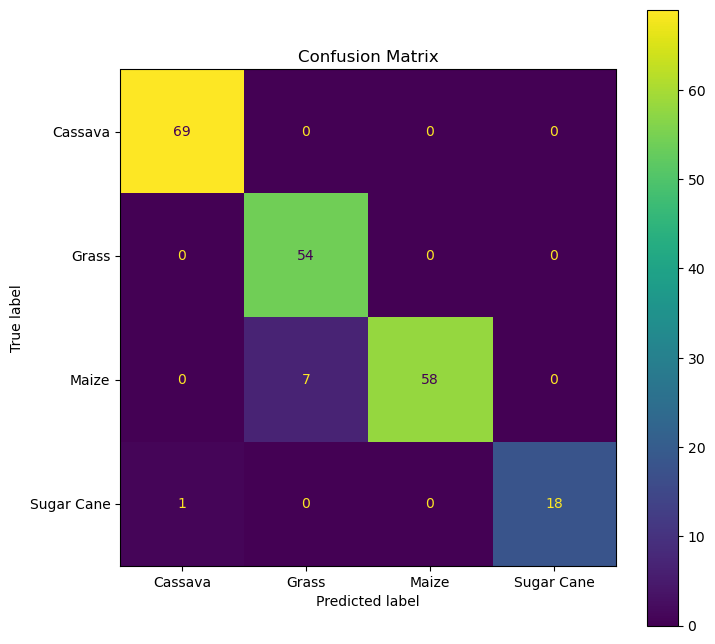

In [63]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()

### Naive Bayes

Accuracy: 0.9033816425120773
Classification Report:
               precision    recall  f1-score   support

     cassava       0.92      0.96      0.94        69
       grass       0.85      0.98      0.91        54
       maize       0.96      0.83      0.89        65
   sugarcane       0.82      0.74      0.78        19

    accuracy                           0.90       207
   macro avg       0.89      0.88      0.88       207
weighted avg       0.91      0.90      0.90       207



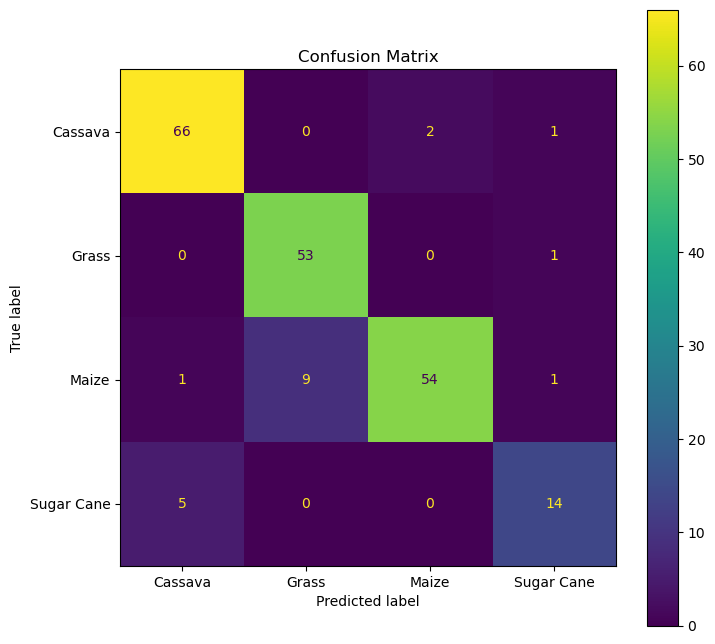

In [64]:
# Train Naive Bayes model
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = nb_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()

### KNN

Accuracy: 0.3140096618357488
Classification Report:
               precision    recall  f1-score   support

     cassava       0.00      0.00      0.00        69
       grass       0.00      0.00      0.00        54
       maize       0.31      1.00      0.48        65
   sugarcane       0.00      0.00      0.00        19

    accuracy                           0.31       207
   macro avg       0.08      0.25      0.12       207
weighted avg       0.10      0.31      0.15       207



/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


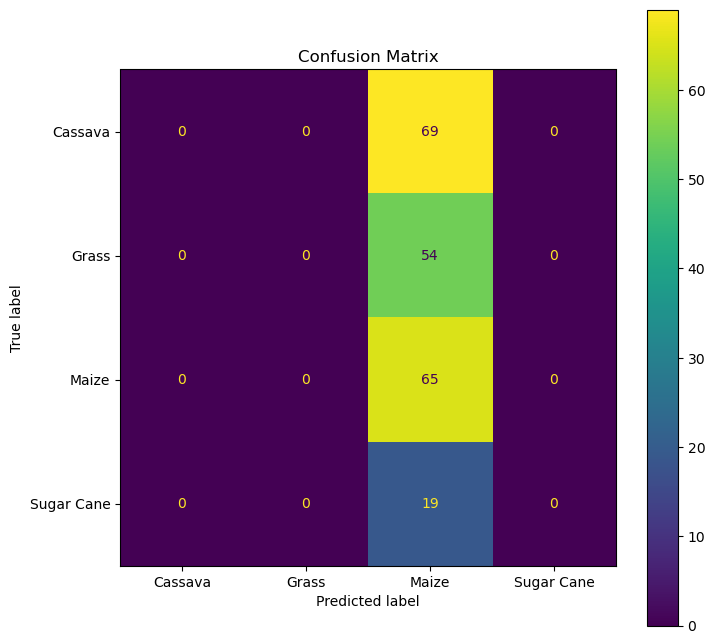

In [55]:
# KNN Classifier
knn_model = KNeighborsClassifier(n_neighbors=5)  # Adjust n_neighbors as needed
knn_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = knn_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()

### SVM

Accuracy: 0.8985507246376812
Classification Report:
               precision    recall  f1-score   support

     cassava       0.89      0.94      0.92        69
       grass       0.83      1.00      0.91        54
       maize       0.96      0.82      0.88        65
   sugarcane       1.00      0.74      0.85        19

    accuracy                           0.90       207
   macro avg       0.92      0.87      0.89       207
weighted avg       0.91      0.90      0.90       207



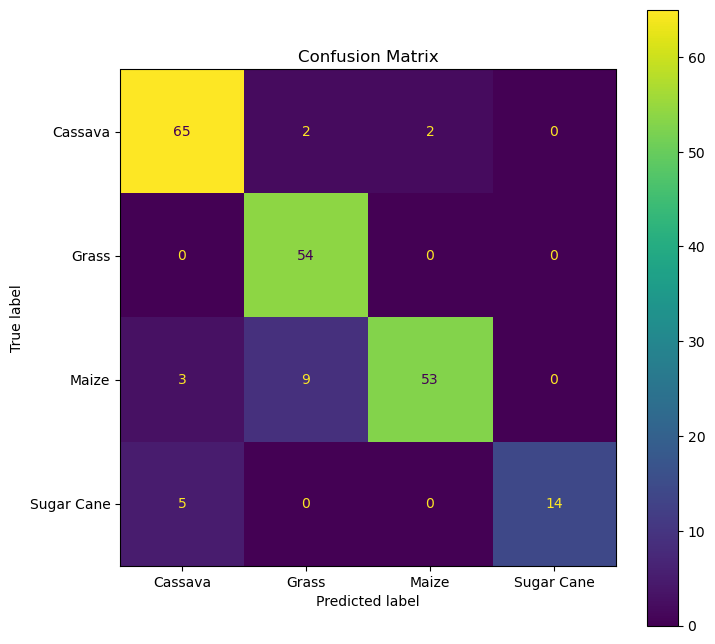

In [56]:
# SVM Classifier
svm_model = SVC(kernel='linear')  # Adjust kernel as needed
svm_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = svm_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()


### Decision Tree

Accuracy: 0.9565217391304348
Classification Report:
               precision    recall  f1-score   support

     cassava       0.99      0.96      0.97        69
       grass       0.93      1.00      0.96        54
       maize       0.97      0.92      0.94        65
   sugarcane       0.90      0.95      0.92        19

    accuracy                           0.96       207
   macro avg       0.95      0.96      0.95       207
weighted avg       0.96      0.96      0.96       207



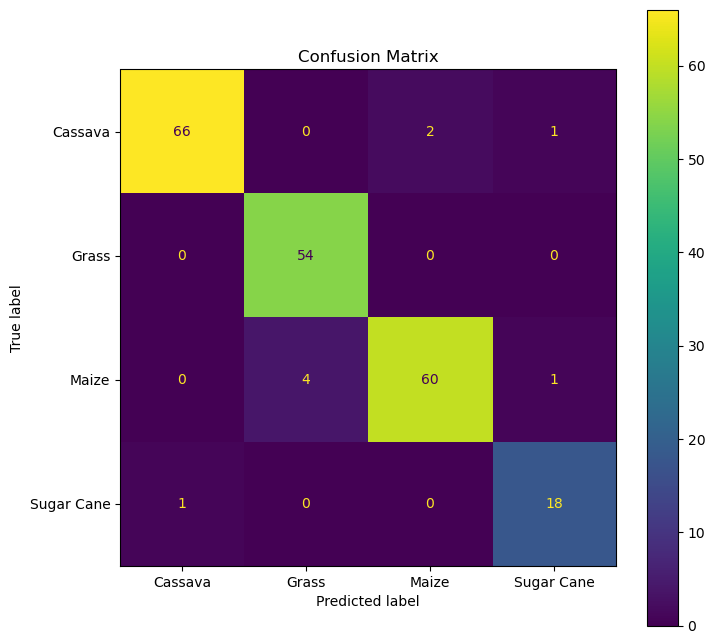

In [57]:
# Decision Tree Classifier
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = dt_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()


### Ada Boost Ensemble Model

Accuracy: 0.8502415458937198
Classification Report:
               precision    recall  f1-score   support

     cassava       0.74      0.97      0.84        69
       grass       0.98      0.91      0.94        54
       maize       0.90      0.92      0.91        65
   sugarcane       0.00      0.00      0.00        19

    accuracy                           0.85       207
   macro avg       0.65      0.70      0.67       207
weighted avg       0.79      0.85      0.81       207



/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/miriam/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


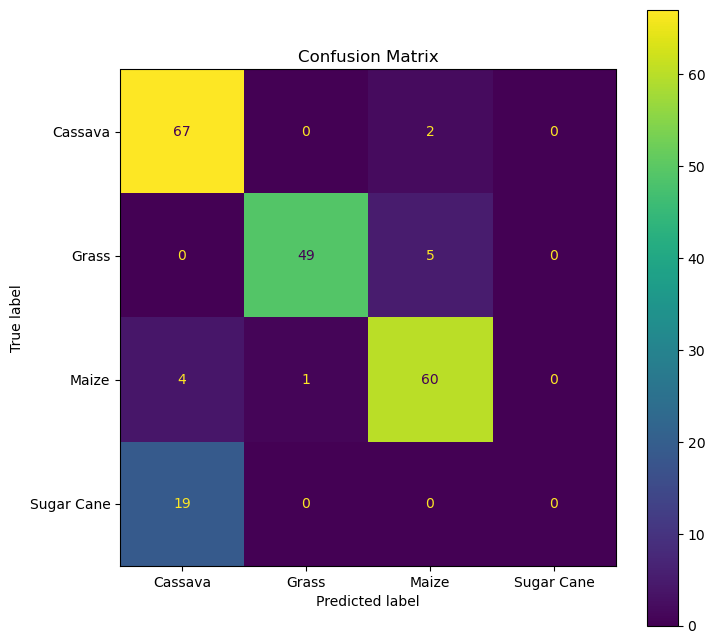

In [58]:
# AdaBoost Classifier
ada_boost_model = AdaBoostClassifier(n_estimators=100, random_state=42)
ada_boost_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = ada_boost_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

matrix = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

plt.figure(figsize=(8,8))
plt.title(f"Confusion Matrix")
cm_display.plot(ax=plt.subplot())
plt.show()


## Ensemble Of the Best Models: Random Forest, Naive Bayes, and Decision Tree

Stacking Classifier Results:
Stacking Classifier Accuracy: 0.9855072463768116
Stacking Classifier Classification Report:
               precision    recall  f1-score   support

     cassava       1.00      0.99      0.99        69
       grass       0.96      1.00      0.98        54
       maize       1.00      0.97      0.98        65
   sugarcane       0.95      1.00      0.97        19

    accuracy                           0.99       207
   macro avg       0.98      0.99      0.98       207
weighted avg       0.99      0.99      0.99       207



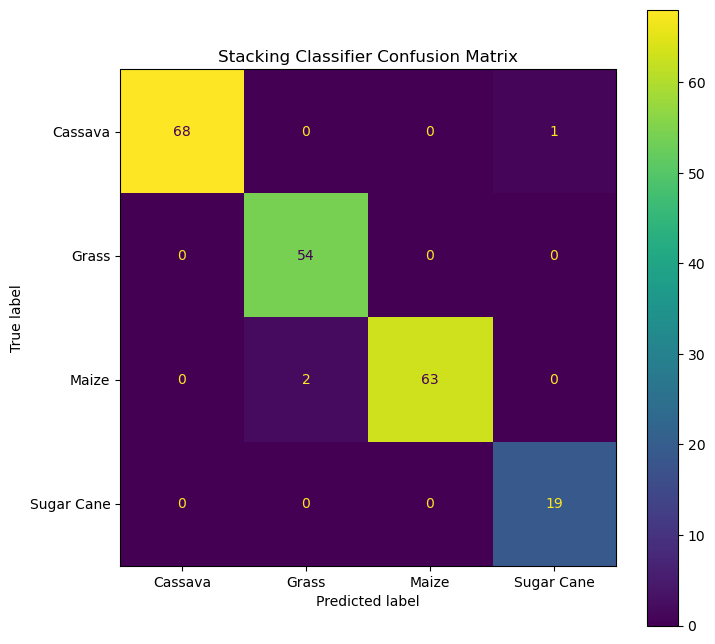

In [59]:
# Create Stacking Classifier
stacking_ensemble = StackingClassifier(
    estimators=[('rf', rf_model), ('dt', dt_model), ('nb', nb_model)],
    final_estimator=LogisticRegression()
)

# Fit and evaluate Stacking Classifier
def fit_and_evaluate_stacking(ensemble_model, X_train, y_train, X_test, y_test):
    ensemble_model.fit(X_train, y_train)
    y_pred = ensemble_model.predict(X_test)

    print("Stacking Classifier Accuracy:", accuracy_score(y_test, y_pred))
    print("Stacking Classifier Classification Report:\n", classification_report(y_test, y_pred))

    matrix = confusion_matrix(y_test, y_pred)
    cm_display = ConfusionMatrixDisplay(confusion_matrix=matrix, display_labels=['Cassava', 'Grass', 'Maize', 'Sugar Cane'])

    plt.figure(figsize=(8, 8))
    plt.title("Stacking Classifier Confusion Matrix")
    cm_display.plot(ax=plt.subplot())
    plt.show()

# Example usage
print("Stacking Classifier Results:")
fit_and_evaluate_stacking(stacking_ensemble, X_train, y_train, X_test, y_test)